---

**Przedmiot:** Uczenie Głębokie<br>
**Moduł:** 3<br>
**Laboratoria:** 7<br>
**Opis laboratoriów:** Poniższy skrypt omawia nowoczesne podejście do generowania obrazów metodą _flow matching_. W przeciwieństwie do klasycznych modeli dyfuzyjnych opartych na stochastycznych równaniach różniczkowych (SDE), Flow Matching wykorzystuje deterministyczne równania różniczkowe zwyczajne (ODE) do modelowania ciągłego przekształcenia szumu w dane.


Wagi modelu są dostępne
[na Dysku Google](https://drive.google.com/file/d/18T3TpprYDALIr_Na1TAGQ_9oQJTC5-8k), są automatycznie pobierane poniżej.

---


# Modele dyfuzyjne

(Według: Ho et al. _Denoising Diffusion Probabilistic Models._ NeurIPS 2020.)

Modele dyfuzyjne (_diffusion models_) to klasa modeli generatywnych, które zyskały ogromną popularność w ostatnich latach (w okolicy 2020 roku), szczególnie w kontekście generowania wysoce realistycznych obrazów. Ich działanie opiera się na symulacji procesu dyfuzji – stopniowego dodawania szumu do danych wejściowych oraz późniejszego uczenia się, jak ten proces odwrócić, aby odzyskać oryginalne dane.

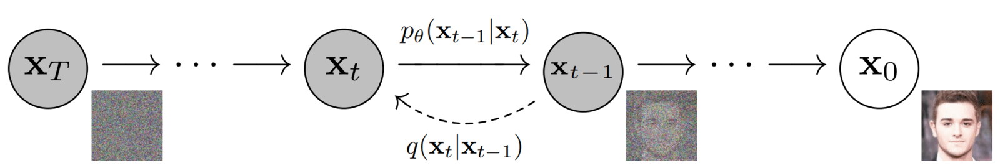

(Źródło obrazka: Ho et al. _Denoising Diffusion Probabilistic Models._ NeurIPS 2020.)

### _Forward Diffusion Process_

Proces ten jest zainspirowany fizycznym procesem dyfuzji dążącym do rozproszenia energii lub cząsteczek w pewnym ośrodku, a zatem do jego ujednolicenia. Na rysunku jest opisany jako $q(x_t|x_{t-1})$. W naszym przypadku polega on na mieszaniu obrazu z szumem próbkowanym z rozkładu normalnego.

### _Reverse Diffusion Process_ (proces dyfuzji wstecz)

Chcielibyśmy móc przeprowadzić proces odwrotny do procesu dyfuzji, czyli tzw. proces dyfuzji wstecz. Na rysunku jest on opisany jako $p_{\theta}(x_{t-1}|x_t)$. Polega on na odwracania procesu dodawania szumu, czyli przechodzenia od szumu do danych rzeczywistych.

## Wstęp

Rozkład $q$ jest zdefiniowany jako _łańcuch Markowa_:

$$q(x_1, ..., x_T|x_0) = \prod_{t=1}^{T}q(x_t|x_{t-1})$$
$$q(x_t|x_{t-1}) = \mathcal{N}(\sqrt{1-\beta_t}x_{t-1}, \beta_t I)$$

gdzie współczynniki $\beta_t$ są znane jako "współczynniki dyfuzji" i są obliczane przy użyciu tzw. harmonogramu wariancji (_variance scheduler_, jest to jakaś funkcja, nie stała wartość), $T$ to liczba kroków, a $x_0$ to wejściowy obraz.

---

Konkretną wartość $x_t$ możemy wyliczyć przez

$$x_t = \sqrt{1-\beta_t}x_{t-1} + \sqrt{\beta_t}\epsilon$$
$$\epsilon \sim \mathcal{N}(0, 1)$$

---

Aby nie musieć za każdym razem przechodzić $t$ kroków autorzy DDPM zaproponowali sztuczkę.

$$\alpha_t = 1 - \beta_t$$
$$\bar{\alpha_t} = \prod_{i=1}^{t}\alpha_i$$

Po podstawieniu $\alpha$ zamiast $\beta$ otrzymujemy

$$q(x_t|x_0) = \mathcal{N}(\sqrt{\bar{\alpha_t}}x_0, (1 - \bar{\alpha_t}) I)$$
$$x_t = \sqrt{\bar{\alpha_t}}x_0 + \sqrt{1 - \bar{\alpha_t}}\epsilon$$

więc możemy otrzymać $x$ w dowolnej chwili czasu w łatwy sposób.

---

Aby odwrócić proces dyfuzji korzystamy z rozkładu $p_{\theta}(x_{t-1}|x_t)$, który przybliżamy przy pomocy sieci neuronowej o parametrach $\theta$. W praktyce jest to sieć, która na wejściu przyjmuje $x_t$ oraz $t$, a zwraca $\hat{\epsilon}$ (lub $\hat{x_0}$), klasycznie o architekturze U-Net, chociaż współcześnie stosuje się sieci DiT (_diffusion transformer_).

---

Zadanie usunięcia szumu wygląda zupełnie inaczej na początku i na końcu procesu. Aby sieć wiedziała, w jakim stopniu "zniszczony" jest obraz, musimy przekazać jej informację o aktualnym kroku $t$. W praktyce wartość $t$ jest kodowana do postaci wektora (podobnie jak _Positional Embeddings_ w Transformerach, często z użyciem funkcji sinus/cosinus) i dodawana do warstw sieci. Dzięki temu model wie, czy ma usuwać zarysy ogólnej struktury (duże $t$), czy wygładzać drobne detale (małe $t$).

## Funkcja straty

Skoro proces dyfuzji wstecz $p_{\theta}$ modelujemy siecią neuronową, musimy zdefiniować fukcję straty. Choć teoretycznie moglibyśmy kazać sieci przewidywać bezpośrednio oryginalny obraz $x_0$, w praktyce najlepsze rezultaty daje uczenie sieci przewidywania **szumu $\epsilon$**, który został dodany do obrazu w danym kroku $t$. Funkcja straty to po prostu błąd średniokwadratowy (MSE) pomiędzy szumem rzeczywistym (wylosowanym w procesie _forward_), a szumem przewidzianym przez sieć:

$$L(\theta) = || \epsilon - \epsilon_\theta(x_t, t) ||^2 $$

Gdzie:
*   $\epsilon \sim \mathcal{N}(0, I)$ to szum użyty do stworzenia $x_t$,
*   $\epsilon_\theta(x_t, t)$ to wywołanie naszej sieci neuronowej (czyli przewidziany szum - $\hat{\epsilon}$),
*   $t$ jest losowane z przedziału $\{1, ..., T\}$ (w praktyce często normalizowane do przedziału $\{0, ..., 1\}$).

## Algorytm samplowania (_inference_)

Mając wytrenowaną sieć, która potrafi estymować szum $\hat{\epsilon}$, możemy wygenerować nowy obraz, startując od czystego szumu $x_T \sim \mathcal{N}(0, I)$. Nie robimy tego jednak w jednym kroku, lecz iteracyjnie, cofając się powoli od $T$ do $0$.

Wzór na przejście z kroku $x_t$ do $x_{t-1}$ wygląda następująco:

$$x_{t-1} = \frac{1}{\sqrt{\alpha_t}} \left( x_t - \frac{1-\alpha_t}{\sqrt{1-\bar{\alpha}_t}} \epsilon_\theta(x_t, t) \right) + \sqrt{\beta_t} \epsilon$$

# _Latent Diffusion Models (LDM)_

Klasyczne modele dyfuzyjne (takie jak opisane wyżej DDPM) działają bezpośrednio w **przestrzeni pikseli** (tzn. wejściem jest obraz oraz wyjściem jest obraz). Dla obrazów o wysokiej rozdzielczości oznacza to operowanie na ogromnych tensorach, co sprawia, że trening i inferencja są niezwykle kosztowne obliczeniowo, w praktyce często nierealne.

Rozwiązaniem tego problemu są modele **Latent Diffusion** (zaproponowane m.in. w pracy Rombach et al. _High-Resolution Image Synthesis with Latent Diffusion Models_, CVPR 2022), na których opiera się słynny **Stable Diffusion**.

Idea polega na rozdzieleniu procesu na dwa etapy:

* **Kompresja percepcyjna:** Wykorzystuje się wytrenowany osobno autoenkoder (zazwyczaj VAE lub VQ-GAN), żeby skompresować obraz wejściowy $x$ z przestrzeni pikseli do znacznie mniejszej, skompresowanej reprezentacji w przestrzeni ukrytej (gdzie $\mathcal{E}$ to enkoder, a $\mathcal{D}$ to dekoder):
  $$z = \mathcal{E}(x)$$
  $$x^\prime = \mathcal{D}(z)$$
* **Dyfuzja w przestrzeni ukrytej:** Właściwy proces dyfuzji (dodawanie i usuwanie szumu) odbywa się na zmiennej **$z$**, a nie na $x$.

Dzięki temu, że przestrzeń ukryta ma znacznie mniejsze wymiary niż oryginalny obraz (np. obraz $512 \times 512 \times 3$ jest redukowany do tensora $64 \times 64 \times 4$), proces jest znacznie szybszy i wymaga mniej pamięci GPU.

# _Flow Matching_ (najbardziej nowoczesne podejście)

**(Z tego korzystają modele takie jak _Flux_, _Stable Diffusion 3_, _Wan_ czy najprawdopodobniej _Sora_)**

Podczas gdy klasyczne modele dyfuzyjne opierają się na stochastycznym procesie "odszumiania", **Flow Matching** proponuje bardziej bezpośrednie podejście do generowania danych. _Flow Matching_ jawnie definiuje deterministyczną ścieżkę (przepływ) pomiędzy rozkładem szumu a rozkładem danych (w zasadzie pomiędzy dwoma dowolnymi rozkładami), traktując proces generacji jako rozwiązywanie równania różniczkowego zwyczajnego (ODE, w przeciwieństwie do SDE w klasycznych modelech dyfuzyjnych). W tym podejściu uczymy sieć neuronową modelowania pola wektorowego (_velocity field_) $v_t(x)$. Pole to wskazuje "kierunek i prędkość", z jaką punkty z rozkładu szumu powinny się przemieszczać w czasie, aby przekształcić się w docelowy rozkład.

## Podstawy koncepcyjne i zmiana notacji

W literaturze dotyczącej _Flow Matching_ i pokrewnych metod jak _Rectified Flow_ często przyjmuje się odwrotną konwencję czasu niż w DDPM ($t=0$ - szum początkowy, $t=1$ - dane rzeczywiste).

Proces generowania polega na przemieszczaniu punktów w czasie $t$ od $0$ do $1$ zgodnie z polem wektorowym $v_t(x)$. Matematycznie proces ten opisuje równanie ODE:

$$ \frac{d x_t}{dt} = v_t(x_t) $$

Co w praktyce można oczywiście zrealizować jako sumę:

$$ x_1 \approx x_0 + \sum_{i=0}^{N-1} v_{t_i}(x_{t_i}) \cdot \Delta t $$


---

W klasycznej dyfuzji ścieżka od danych do szumu jest wyznaczana przez proces Gaussa i jest z natury "zakrzywiona" oraz losowa. W Flow Matching możemy sami zdefiniować, jak ma wyglądać idealna ścieżka interpolacji między szumem a danymi. Najprostszą, a zarazem najbardziej efektywną ścieżką jest **linia prosta**. Definiujemy proces interpolacji jako średnią ważoną szumu i danych:

$$ x_t = (1 - t)x_0 + t x_1 $$

## Funkcja straty

Funkcja straty to po prostu błąd średniokwadratowy między wyjściem z sieci a faktycznym kierunkiem "do celu":

$$ L(\theta) = || v_{\theta}(x_t, t) - (x_1 - x_0) ||^2 $$

# Funkcje pomocnicze

In [ ]:
%pip install kaggle kornia torcheval ema-pytorch tensorboard matplotlib scipy tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 33.8 MB/s eta 0:00:00


In [ ]:
import glob
import math
import sys
from abc import abstractmethod

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from diffusers import AutoencoderKL
from ema_pytorch import EMA
from IPython.display import display, Markdown
from scipy.integrate import solve_ivp
from torch.utils.tensorboard import SummaryWriter
from torcheval.metrics import FrechetInceptionDistance
from torchvision import datasets, io, transforms
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid
from tqdm import tqdm

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
torch.set_float32_matmul_precision("high")
torch.backends.cudnn.benchmark = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IN_COLAB = 'google.colab' in sys.modules
%load_ext tensorboard

/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


In [ ]:
!gdown https://drive.google.com/uc?id=18T3TpprYDALIr_Na1TAGQ_9oQJTC5-8k
!unzip -o ./flow_matching.zip
!rm ./flow_matching.zip

Downloading...
From (original): https://drive.google.com/uc?id=18T3TpprYDALIr_Na1TAGQ_9oQJTC5-8k
From (redirected): https://drive.google.com/uc?id=18T3TpprYDALIr_Na1TAGQ_9oQJTC5-8k&confirm=t&uuid=f664070b-2ca9-48be-81a6-7b64d92d677c
To: /content/flow_matching.zip
100% 1.36G/1.36G [00:15<00:00, 89.9MB/s]
Archive:  ./flow_matching.zip
   creating: logs/
   creating: logs/ffhq_128_224x3/
 extracting: logs/ffhq_128_224x3/events.out.tfevents.1768000596.Aurora.142178.0  
  inflating: logs/ffhq_128_224x3/model_ema_59.pth  
 extracting: temp.npz                


# Implementacja VAE i obsługa przestrzeni ukrytej

Poniższy kod ładuje pre-trenowany autoenkoder (pochodzący z _Stable Diffusion XL_) oraz definiuje funkcje niezbędne do kompresji obrazów do reprezentacji ukrytej i ich rekonstrukcji, uwzględniając przy tym wymagane skalowanie i normalizację danych dla naszego zbioru danych.

In [ ]:
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix").to(device)
vae.eval()

SDXL_SCALING_FACTOR = 0.13025

mean = torch.tensor([-0.1550, -0.2076, -0.0139, 0.2067]).view(1, -1, 1, 1).to(device)
std = torch.tensor([0.9437, 0.7664, 0.9089, 0.7108]).view(1, -1, 1, 1).to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [ ]:
def vae_encode(img):
    with torch.no_grad():
        dist = vae.encode(img).latent_dist
        latents = dist.mode()
        latents = latents * SDXL_SCALING_FACTOR
        latents = (latents - mean) / std
    return latents


def vae_decode(latents):
    with torch.no_grad():
        latents = latents * std + mean
        latents = latents / SDXL_SCALING_FACTOR
        decoded = vae.decode(latents).sample
    return decoded

# Zbiór danych

Skorzystamy ponownie ze zbioru Flickr-Faces-HQ Dataset (FFHQ).

In [ ]:
if IN_COLAB:
    import os
    from google.colab import userdata

    os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
    os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

    !kaggle datasets download imcr00z/flickr-faces-70k-thumbnails-128x128
    !unzip -q flickr-faces-70k-thumbnails-128x128.zip
    !rm flickr-faces-70k-thumbnails-128x128.zip

Dataset URL: https://www.kaggle.com/datasets/imcr00z/flickr-faces-70k-thumbnails-128x128
License(s): unknown
 96% 1.88G/1.97G [00:18<00:02, 40.3MB/s]
100% 1.97G/1.97G [00:18<00:00, 114MB/s] 


In [ ]:
class CustomImageDataset(data.Dataset):
    def __init__(self, paths: list[str], transform=None):
        super().__init__()

        self.paths = paths
        self.transform = transform or (lambda x: x)

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, i):
        return self.transform(io.read_image(self.paths[i], mode=io.ImageReadMode.RGB)), 0

In [ ]:
class PrecomputedVAEDataset(data.Dataset):
    def __init__(
        self,
        paths,
        transform=None,
        batch_size=64,
        temp_path="temp.npz",
    ):
        super().__init__()

        try:
            self.latents = torch.from_numpy(np.load(temp_path)["latents"])

        except Exception:
            temp_dataset = CustomImageDataset(paths, transform=transform)
            temp_loader = data.DataLoader(
                temp_dataset, batch_size=batch_size, num_workers=0, shuffle=False
            )
            encoded_latents = []
            with torch.no_grad():
                for batch_imgs, _ in tqdm(temp_loader):
                    encoded_latents.append(vae_encode(batch_imgs.to(device)).cpu())

            self.latents = torch.cat(encoded_latents, dim=0)

            np.savez_compressed(temp_path, latents=self.latents.numpy())

    def __len__(self):
        return len(self.latents)

    def __getitem__(self, i):
        return self.latents[i], 0

In [ ]:
def prepare_dataset_ffhq(split="train"):
    transform = transforms.Compose(
        [
            # transforms.Resize(128, antialias=True),
            transforms.Lambda(lambda x: x.to(torch.float32) / 127.5 - 1),
        ]
    )
    path = "thumbnails128x128"
    paths = list(glob.glob(f"{path}/*.png"))
    paths.sort()

    splitting_idx = 60_000
    if split == "train":
        paths = paths[:splitting_idx]
        dataset = PrecomputedVAEDataset(paths=paths, transform=transform)
    else:
        paths = paths[splitting_idx:]
        dataset = CustomImageDataset(paths=paths, transform=transform)

    return dataset

In [ ]:
def prepare_dataloader(
    dataset: data.Dataset,
    batch_size=128,
    num_workers=0,
    shuffle=True,
):
    dataloader = data.DataLoader(
        dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        drop_last=True,
        shuffle=shuffle,
    )
    return dataloader

In [ ]:
train_dataset = prepare_dataset_ffhq()
train_dataloader = prepare_dataloader(train_dataset)

val_dataset = prepare_dataset_ffhq(split="val")
val_dataloader = prepare_dataloader(val_dataset, shuffle=False)

## Wizualizacja przejścia w przestrzeń ukrytą autoenkodera

# $x$

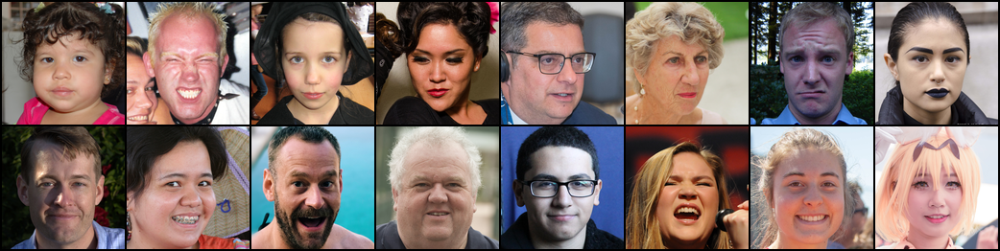

# $z = \mathcal{E}(x)$ (przeskalowane)

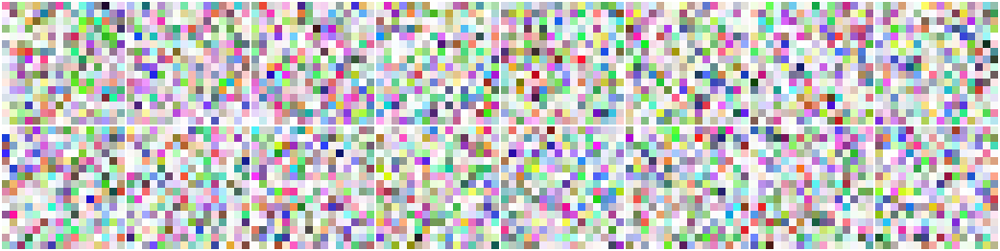

# $x^\prime = \mathcal{D}(z)$

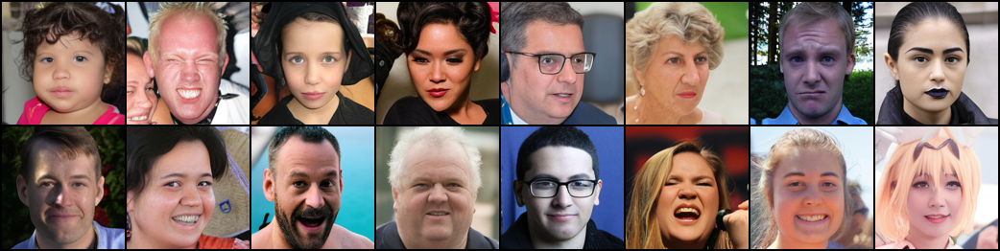

# $x$ vs $x^\prime$ (tracimy szczegóły)

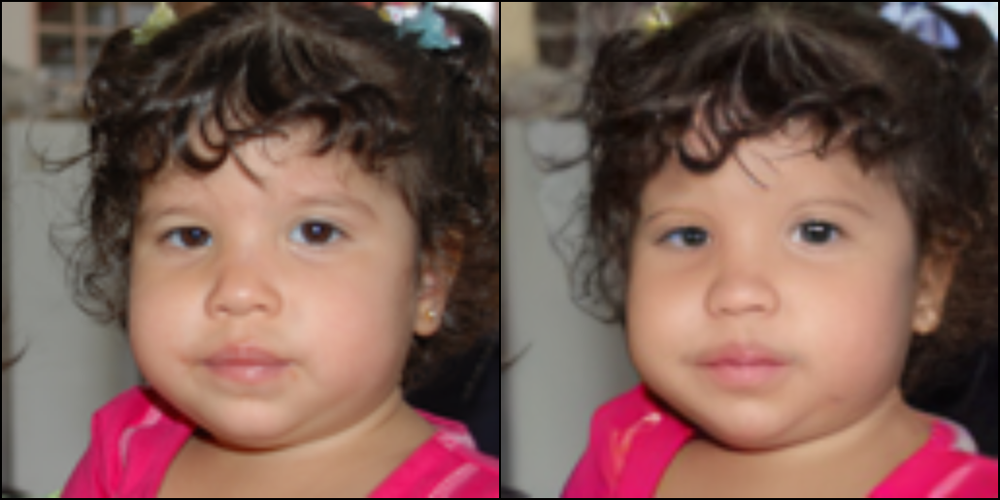

In [ ]:
display(Markdown(r"# $x$"))
images = next(iter(val_dataloader))[0][:16]
display(to_pil_image(make_grid(images / 2 + 0.5).clip(0, 1)))
A = images[0, None]

display(Markdown(r"# $z = \mathcal{E}(x)$ (przeskalowane)"))
latents = vae_encode(images.to(device)).cpu()
latents_x_16 = F.interpolate(latents, size=(128, 128), mode="nearest")
display(to_pil_image(make_grid(latents_x_16)))

display(Markdown(r"# $x^\prime = \mathcal{D}(z)$"))
images = vae_decode(latents.to(device)).cpu()
display(to_pil_image(make_grid(images / 2 + 0.5).clip(0, 1)))
A_prim = images[0, None]

display(Markdown(r"# $x$ vs $x^\prime$ (tracimy szczegóły)"))
A_pair = torch.cat((A, A_prim), dim=0)
A_pair_x_4 = F.interpolate(A_pair, size=(512, 512), mode="bilinear")
display(to_pil_image(make_grid(A_pair_x_4 / 2 + 0.5).clip(0, 1)))

# Architektura modelu

## Kodowanie kroku czasowego

Ponownie korzystamy z _positional encoding_, który poznaliśmy na zajęciach o NeRFach i później o transformerach.

In [ ]:
def timestep_embedding(timesteps, dim=128, max_period=0.05):
    half = dim // 2
    freqs = torch.exp(
        -math.log(max_period) * torch.arange(start=0, end=half) / half
    ).to(device=timesteps.device)
    args = timesteps * freqs[None]
    embedding = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)
    return embedding

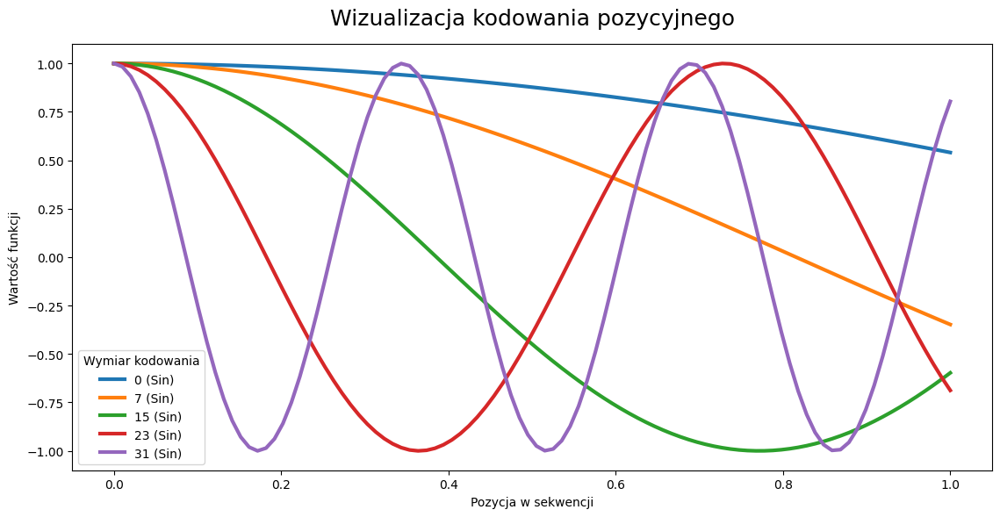

In [ ]:
dim = 64
x_values = torch.linspace(0, 1, 100)

plt.figure(figsize=(11.5, 6))
plt.title("Wizualizacja kodowania pozycyjnego", fontsize=18, pad=16)

dims_to_plot = [0, 7, 15, 23, 31]
data_list = []

for x_value in x_values.numpy().tolist():
    for d in dims_to_plot:
        if d < dim // 2:
            label = f"{d} (Sin)"
        else:
            label = f"{d} (Cos)"

        data_list.append({
            "Pozycja w sekwencji": x_value,
            "Wartość funkcji": timestep_embedding(torch.tensor([x_value]), dim).detach().numpy()[0, d],
            "Wymiar kodowania": label
        })

df = pd.DataFrame(data_list)

sns.lineplot(
    data=df,
    x="Pozycja w sekwencji",
    y="Wartość funkcji",
    hue="Wymiar kodowania",
    linewidth=3,
)

plt.tight_layout()
plt.show()

## Implementacja sieci U-Net

Poniższa implementacja jest mocno inspirowana oficjalnym repozytorium dołączonym do pracy Rombach et al. _High-Resolution Image Synthesis with Latent Diffusion Models_, CVPR 2022.

Sztuczka: warstwy przyjmujące _time embedding_ będą dziedziczyły po `TimestepBlock`.

In [ ]:
class TimestepBlock(nn.Module):
    @abstractmethod
    def forward(self, x, emb):
        pass

In [ ]:
class TimestepEmbedSequential(nn.Sequential, TimestepBlock):
    def forward(self, x, emb):
        for layer in self:
            if isinstance(layer, TimestepBlock):
                x = layer(x, emb)
            else:
                x = layer(x)
        return x

In [ ]:
class Upsample(nn.Module):
    def __init__(self, channels, out_channels=None):
        super().__init__()
        self.conv = nn.Conv2d(channels, out_channels or channels, 3, padding=1, bias=False)

    def forward(self, x):
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.conv(x)
        return x

In [ ]:
class Downsample(nn.Module):
    def __init__(self, channels, out_channels=None):
        super().__init__()
        self.op = nn.Conv2d(channels, out_channels or channels, 3, stride=2, padding=1, bias=False)

    def forward(self, x):
        return self.op(x)

### Stosujemy _Group Norm_

Intuicja: _Group Norm_ uniezależnia normalizację od rozmiaru batcha.

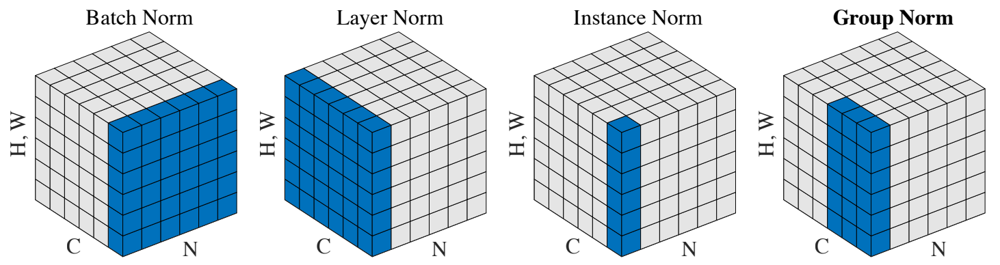

In [ ]:
def normalization(channels):
    return nn.GroupNorm(32, channels)

Sztuczka: zerujemy wagi ostatnich warstw w blokcach rezydualnych.

In [ ]:
def zero_module(module):
    for p in module.parameters():
        p.detach().zero_()
    return module

In [ ]:
class ResBlock(TimestepBlock):
    def __init__(self, channels, emb_channels, out_channels=None):
        super().__init__()
        self.channels = channels
        self.out_channels = out_channels or channels

        self.in_layers = nn.Sequential(
            normalization(channels),
            nn.SiLU(),
            nn.Conv2d(channels, self.out_channels, 3, padding=1, bias=False),
        )

        self.emb_layers = nn.Sequential(
            nn.SiLU(),
            nn.Linear(emb_channels, self.out_channels),
        )

        self.out_layers = nn.Sequential(
            normalization(self.out_channels),
            nn.SiLU(),
            zero_module(nn.Conv2d(self.out_channels, self.out_channels, 3, padding=1, bias=False)),
        )

        if self.out_channels == channels:
            self.skip_connection = nn.Identity()
        else:
            self.skip_connection = nn.Conv2d(channels, self.out_channels, 1, bias=False)

    def forward(self, x, emb):
        h = self.in_layers(x)

        emb_out = self.emb_layers(emb)

        while len(emb_out.shape) < len(h.shape):
            emb_out = emb_out[..., None]

        h = h + emb_out
        h = self.out_layers(h)
        h = self.skip_connection(x) + h

        return h

In [ ]:
class UNetModel(nn.Module):
    def __init__(
        self,
        in_out_channels=4,
        model_channels=224,
        num_res_blocks=3,
        channel_mult=(1, 2, 3),
    ):
        super().__init__()
        self.in_out_channels = in_out_channels
        self.model_channels = model_channels
        self.num_res_blocks = num_res_blocks
        self.channel_mult = channel_mult

        # Embed time
        time_embed_dim = model_channels * 4
        self.time_embed = nn.Sequential(
            nn.Linear(model_channels, time_embed_dim),
            nn.SiLU(),
            nn.Linear(time_embed_dim, time_embed_dim),
        )

        # Encoder
        self.input_blocks = nn.ModuleList([
            TimestepEmbedSequential(nn.Conv2d(in_out_channels, model_channels, 3, padding=1, bias=False))
        ])

        input_block_chans = [model_channels]
        ch = model_channels
        ds = 1

        for level, mult in enumerate(channel_mult):
            for _ in range(num_res_blocks):
                layers = [
                    ResBlock(ch, time_embed_dim, out_channels=mult * model_channels)
                ]
                ch = mult * model_channels

                self.input_blocks.append(TimestepEmbedSequential(*layers))
                input_block_chans.append(ch)

            if level != len(channel_mult) - 1:
                self.input_blocks.append(
                    TimestepEmbedSequential(Downsample(ch))
                )
                input_block_chans.append(ch)
                ds *= 2

        # Bottleneck
        self.middle_block = TimestepEmbedSequential(
            ResBlock(ch, time_embed_dim),
            ResBlock(ch, time_embed_dim),
        )

        # Decoder
        self.output_blocks = nn.ModuleList([])

        for level, mult in list(enumerate(channel_mult))[::-1]:
            for i in range(num_res_blocks + 1):
                ich = input_block_chans.pop()
                layers = [
                    ResBlock(ch + ich, time_embed_dim, out_channels=model_channels * mult)
                ]
                ch = model_channels * mult

                if level and i == num_res_blocks:
                    layers.append(Upsample(ch))
                    ds //= 2

                self.output_blocks.append(TimestepEmbedSequential(*layers))

        self.out = nn.Sequential(
            normalization(ch),
            nn.SiLU(),
            zero_module(nn.Conv2d(model_channels, in_out_channels, 3, padding=1, bias=False)),
        )

    def forward(self, x, timesteps):
        # Embed time
        t_emb = timestep_embedding(timesteps, self.model_channels)
        emb = self.time_embed(t_emb)

        # Encoder
        hs = []
        h = x
        for module in self.input_blocks:
            h = module(h, emb)
            hs.append(h)

        # Bottleneck
        h = self.middle_block(h, emb)

        # Decoder
        for module in self.output_blocks:
            h = torch.cat([h, hs.pop()], dim=1)
            h = module(h, emb)

        return self.out(h)

# Funkcja straty

$$ L(\theta) = || v_{\theta}(x_t, t) - (x_1 - x_0) ||^2 $$

In [ ]:
def flow_matching_loss(model, x0, x1, t):
    # Interpolacja liniowa
    xt = (1 - t.unsqueeze(-1).unsqueeze(-1)) * x0 + t.unsqueeze(-1).unsqueeze(-1) * x1

    # Rzeczywista prędkość (Ground Truth)
    v_target = x1 - x0

    # Przewidziana prędkość
    v_pred = model(xt, t)

    # Strata MSE
    return F.mse_loss(v_pred, v_target)

# Źródłowy rozkład

In [ ]:
def sample_source(batch_size, img_channels=4, img_size=16):
    return torch.randn(batch_size, img_channels, img_size, img_size)

# Uczenie modelu

1.  Wylosuj szum $x_0$ i czas $t$.
2.  Zinterpoluj obraz $x_t$.
3.  Oblicz "prędkość" $x_1 - x_0$.
4.  Oblicz stratę MSE predykcji modelu.

In [ ]:
fid_cache = FrechetInceptionDistance(device=device)

for real_images, _ in tqdm(val_dataloader):
    real_images.to(device)
    fid_cache.update((real_images / 2 + 0.5).clip(0, 1), is_real=True)

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:01<00:00, 90.7MB/s]
100%|██████████| 78/78 [00:41<00:00,  1.89it/s]


In [ ]:
def train_model(
    model, model_ema, num_epochs=60, lr=2e-4, log_dir="logs/ffhq_128"
):
    writer = SummaryWriter(log_dir=log_dir)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        model.train()
        epoch_losses = []

        pbar = tqdm(train_dataloader, desc=f"Epoch {epoch}/{num_epochs}")
        for batch_idx, (real_images, _) in enumerate(pbar):

            if IN_COLAB and batch_idx >= 20:
                print("To tylko demo na Google Colab, pomijamy resztę datasetu")
                break

            real_images = real_images.to(device)
            batch_size = real_images.shape[0]

            # Losowanie szumu i czasu
            noise = sample_source(batch_size).to(device)
            t = torch.rand(batch_size, 1).to(device)

            # Obliczenie straty
            loss = flow_matching_loss(model, noise, real_images, t)

            # Propagacja wsteczna
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            model_ema.update()

            epoch_losses.append(loss.item())
            pbar.set_postfix({"loss": f"{np.mean(epoch_losses):.4f}"})

        avg_loss = np.mean(epoch_losses)
        print(f"Epoch {epoch} | Average Loss: {avg_loss:.4f}")
        writer.add_scalar("Loss:", avg_loss, epoch)

        if (epoch + 1) % 5 == 0:
            torch.save(model_ema.state_dict(), f"model_ema_{epoch}.pth")

            fid = FrechetInceptionDistance(device=device)
            fid.merge_state([fid_cache])

            for _ in tqdm(range(32)):
                fid.update(
                    generate_images(model_ema, 32, should_display=False, num_steps=20),
                    is_real=False,
                )

            fid_value = fid.compute().item()
            print("Fid:", fid_value)
            writer.add_scalar("FID", fid_value, epoch)

            grid = make_grid(generate_images(model_ema, 16))
            writer.add_image("Samples", grid, epoch)
    writer.close()

# Generowanie obrazów

Aby wygenerować obraz, musimy rozwiązać równanie różniczkowe:

$$ \frac{d x_t}{dt} = v_t(x_t) $$

Korzystamy z najprostszej numerycznej metody rozwiązania tego problemu - metody Eulera. Zaczynamy od szumu $x_0$ i całkujemy do $t=1$ powtartzając w pętli:

$$ x_{t+\Delta t} = x_t + v_\theta(x_t, t) \cdot \Delta t $$

gdzie $\Delta t$ to krok czasowy (dla $n$ kroków czasowych $\Delta t = \frac{1}{n}$).

In [ ]:
def sample_flow_images_euler(model, batch_size, num_steps, display_every=None, x=None):
    model.eval()

    with torch.no_grad():
        # Start od szumu
        x = x if x != None else sample_source(batch_size).to(device)
        x0 = x.clone()

        # Metoda Eulera:
        dt = 1.0 / num_steps
        for step in range(num_steps):
            t = torch.full((batch_size, 1), step * dt, dtype=torch.float32).to(device)

            # Predykcji "prędkości"
            velocity = model(x, t)

            # Krok algorytmu
            x = x + velocity * dt

            # Łagodne przycinanie, aby uniknąć niestabilności
            x = torch.clamp(x, -3.0, 3.0)

            if display_every and (step + 1) % display_every == 0:
                x_pred = torch.cat([x + (1 - step * dt) * velocity, x], dim=0)
                x_pred = vae_decode(x_pred)
                x_pred = (x_pred / 2 + 0.5).clamp(0, 1)
                display(to_pil_image(make_grid(x_pred.cpu())))

    return x

In [ ]:
def generate_images(model, num_images=8, should_display=True, num_steps=50, display_every=None):
    x = sample_flow_images_euler(model, num_images, num_steps=num_steps, display_every=display_every)
    x = vae_decode(x)
    x = (x / 2 + 0.5).clamp(0, 1)
    if should_display:
        display(to_pil_image(make_grid(x.cpu())))
    return x

# Uczenie modelu

In [ ]:
model = UNetModel().to(device)
model_ema = EMA(model, beta=0.9999, update_after_step=10, update_every=1)

train_model(model, model_ema, num_epochs=2, log_dir="logs/ffhq_128_colab")

Epoch 0/2:   4%|▍         | 20/468 [00:34<12:51,  1.72s/it, loss=1.8173]


To tylko demo na Google Colab, pomijamy resztę datasetu
Epoch 0 | Average Loss: 1.8173


Epoch 1/2:   4%|▍         | 20/468 [00:15<05:38,  1.32it/s, loss=1.6184]

To tylko demo na Google Colab, pomijamy resztę datasetu
Epoch 1 | Average Loss: 1.6184


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### Ładowanie prerenowanego modelu

In [ ]:
model_ema.load_state_dict(torch.load("logs/ffhq_128_224x3/model_ema_59.pth", map_location=device, weights_only=True))
model_ema.eval()
pass

### Obliczenie faktycznego FID (bardzo kosztowne obliczeniowo)

In [ ]:
fid = FrechetInceptionDistance(device=device)
fid.merge_state([fid_cache])

for _ in tqdm(range(156)):
    fid.update(
        generate_images(model_ema, 64, should_display=False, num_steps=50),
        is_real=False,
    )
fid_value = fid.compute().item()

print("Fid:", fid_value)

FID dla 50 kroków: 12.473052978515625

FID dla 100 kroków: 11.90142822265625

# Wizualizcje

### Kolejne kroki generowania

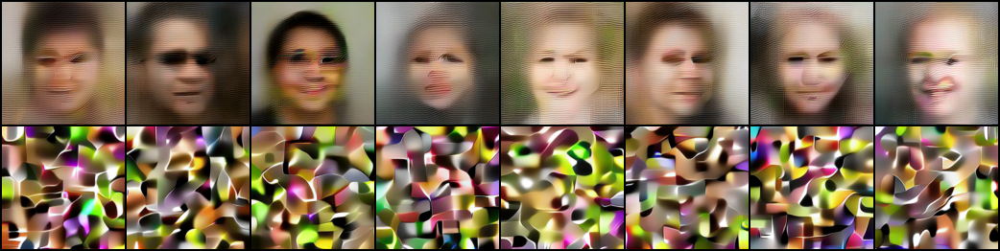

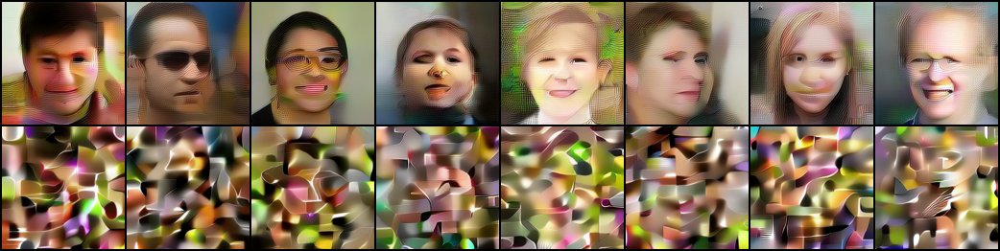

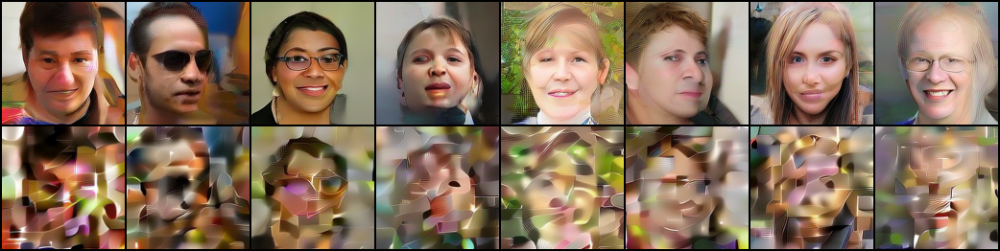

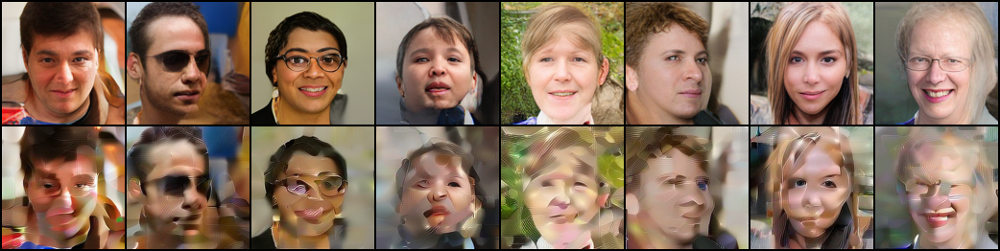

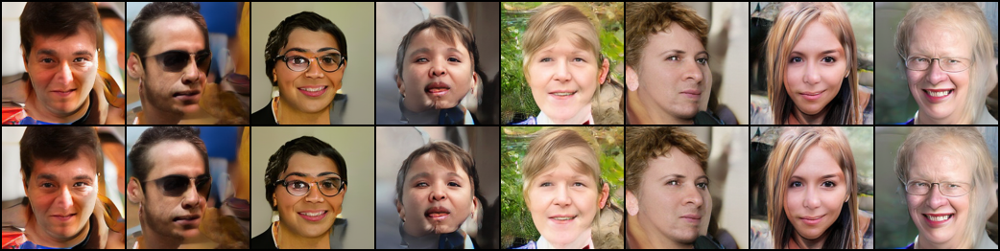

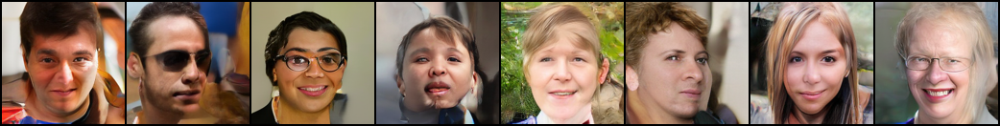

In [ ]:
generate_images(model_ema, 8, num_steps=100, display_every=20)
pass

# _Latent Inversion_ i interpolacja

In [ ]:
def invert_flow_images_euler(model, x, num_steps=50):
    model.eval()
    x = x.clone()

    with torch.no_grad():
        dt = 1.0 / num_steps

        for step in range(num_steps):
            current_t = 1.0 - step * dt

            t = torch.full((x.shape[0], 1), current_t, dtype=torch.float32).to(device)

            velocity = model(x, t)

            x = x - velocity * dt

            x = torch.clamp(x, -3.0, 3.0)

    return x

<>:48: SyntaxWarning: invalid escape sequence '\p'
<>:48: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipython-input-1985273459.py:48: SyntaxWarning: invalid escape sequence '\p'
  display(Markdown("# $x^\prime$ (generowanie z $z_0$)"))


# $x$

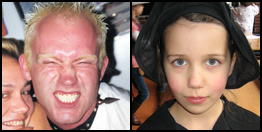

# $z_1$

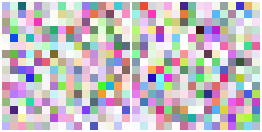

# $z_0$

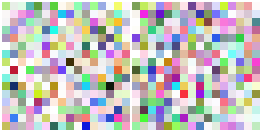

# Interpolacja $z_0$

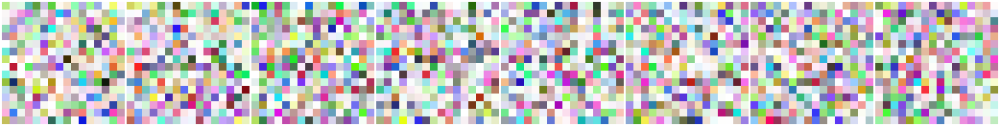

# $x^\prime$ (generowanie z $z_0$)

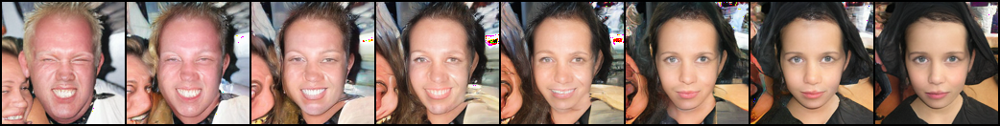

In [ ]:
images = next(iter(val_dataloader))[0]
image_a = images[None, 1]
image_b = images[None, 2]
images = torch.cat((image_a, image_b), dim=0)

display(Markdown(r"# $x$"))
display(to_pil_image(make_grid(images * 0.5 + 0.5)))

# ---


display(Markdown(r"# $z_1$"))
latents = vae_encode(images.to(device))

latents_x_16 = F.interpolate(latents, size=(128, 128), mode="nearest")
display(to_pil_image(make_grid(latents_x_16)))

# ---


display(Markdown(r"# $z_0$"))
latents = invert_flow_images_euler(model_ema, latents)

latents_x_16 = F.interpolate(latents, size=(128, 128), mode="nearest")
display(to_pil_image(make_grid(latents_x_16)))

# ---


display(Markdown(r"# Interpolacja $z_0$"))
t = torch.linspace(0, 1, steps=8, device=device).view(-1, 1, 1, 1)

# Calculate the angle (omega) between the two latent vectors
omega = torch.acos((latents[0] * latents[1]).sum() / (latents[0].norm() * latents[1].norm()))

# Apply Slerp
latents = (torch.sin((1 - t) * omega) / omega.sin()) * latents[0, None] + (torch.sin(t * omega) / omega.sin()) * latents[1, None]

# ... or Lerp
# latents = latents[0, None] * (1 - t) + latents[1, None] * t

latents_x_16 = F.interpolate(latents, size=(128, 128), mode="nearest")
display(to_pil_image(make_grid(latents_x_16)))

# ---


display(Markdown(r"# $x^\prime$ (generowanie z $z_0$)"))
latents = sample_flow_images_euler(model_ema, batch_size=8, num_steps=100, x=latents)

images = vae_decode(latents.to(device))
display(to_pil_image(make_grid(images * 0.5 + 0.5)))

### Materiały dodatkowe:


*  Polecam podręcznik _The Principles of Diffusion Models_ [arxiv.org/pdf/2510.21890](https://arxiv.org/pdf/2510.21890)